# Dealiasing Velocity

In [1]:
# First import needed modules.
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import pyart


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
radar = pyart.io.read("MDV-20150805-084449-PPIVol.nc")
radar.info()

altitude:
	data: <ndarray of type: float64 and shape: (1,)>
	standard_name: altitude
	units: meters
altitude_agl: None
antenna_transition: None
azimuth:
	data: <ndarray of type: float32 and shape: (9270,)>
	standard_name: beam_azimuth_angle
	long_name: azimuth_angle_from_true_north
	units: degrees
	axis: radial_azimuth_coordinate
elevation:
	data: <ndarray of type: float32 and shape: (9270,)>
	standard_name: beam_elevation_angle
	long_name: elevation_angle_from_horizontal_plane
	units: degrees
	axis: radial_elevation_coordinate
fields:
	DBZH:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: equivalent_reflectivity_factor_h
		units: dBZ
		_FillValue: -32768
		coordinates: elevation azimuth range
	DBZV:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: equivalent_reflectivity_factor_v
		units: dBZ
		_FillValue: -32768
		coordinates: elevation azimuth range
	VELH:
		data: <ndarray of type: float32 and shape: (9270, 2500)>
		long_name: radial_ve

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. P

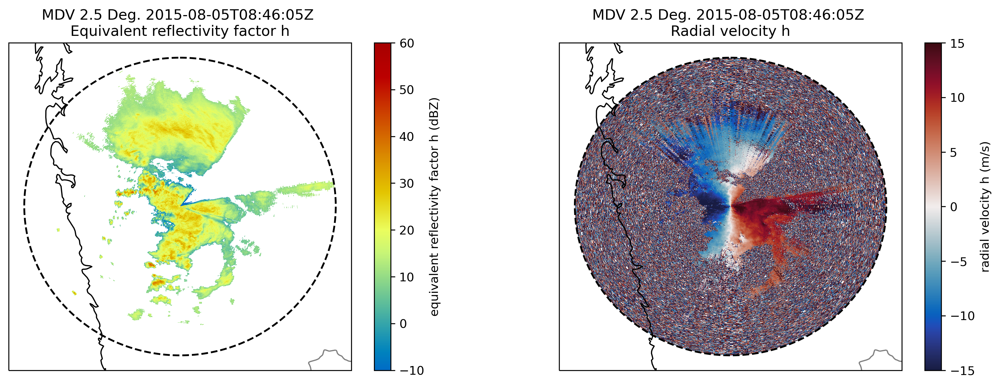

In [148]:
fig = plt.figure(figsize=[15,5],dpi=300)
ax = plt.subplot(1,2,1,projection=ccrs.PlateCarree())
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('DBZH', sweep=2, resolution='10m',
                     vmin=-10, vmax=60,
                     projection=ccrs.PlateCarree())
display.plot_range_ring(radar.range['data'][2], line_style='k--')

ax2 = plt.subplot(1,2,2,projection=ccrs.PlateCarree())
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('VELH', sweep=2, resolution='10m',
                     vmin=-15, vmax=15,
                     projection=ccrs.PlateCarree(), cmap='pyart_balance')
display.plot_range_ring(radar.range['data'][2],label=radar.range['data'][2], line_style='k--')
#plt.tight_layout() 
plt.show()


In [4]:
# First, for dealiasing to work efficiently, we need to use a GateFilter. Looks like, and we need to
# do some preprocessing on the data to remove noise and clutter. Thankfully, Py-ART gives us the
# capability to do this. As a simple filter in this example, we will first calculate the velocity texture
# using Py-ART's calculate_velocity_texture function. The velocity texture is the standard deviation of
# velocity surrounding a gate. This will be higher in the presence of noise.

In [5]:
radar.instrument_parameters['nyquist_velocity']['data']

masked_array(data=[23.625, 23.625, 23.625, ..., 23.625, 23.625, 23.625],
             mask=False,
       fill_value=1e+20,
            dtype=float32)

In [164]:
# Set the nyquist to what we see in the instrument parameter above.
# Calculate the velocity texture
vel_texture = pyart.retrieve.calculate_velocity_texture(radar, vel_field='VELH', wind_size=3, nyq=23.625)
radar.add_field('velocity_texture', vel_texture, replace_existing=True)

/opt/anaconda3/lib/python3.8/site-packages/pyart/util/sigmath.py:57: RuntimeWarning: invalid value encountered in sqrt
  std_dev = np.sqrt(-2 * np.log(norm)) * (half_width) / np.pi


/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


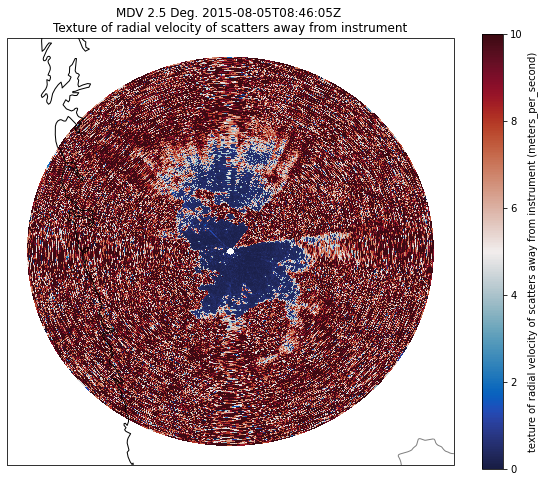

In [165]:
# Let us see what the velocity texture looks like.
fig = plt.figure(figsize=[10, 8])
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('velocity_texture', sweep=2, resolution='10m',
                     vmin=0, vmax=10,
                     projection=ccrs.PlateCarree(), cmap='pyart_balance')
plt.show()

In [8]:
# Plot a histogram of velocity texture to get a better idea of what values correspond to
# hydrometeors and what values of texture correspond to artifacts.
# In the below example, a threshold of 3 would eliminate most of the peak corresponding to noise
# around 6 while preserving most of the values in the peak of ~0.5 corresponding to hydrometeors.
#hist, bins = np.histogram(radar.fields['velocity_texture']['data'], bins=150)
#bins = (bins[1:]+bins[:-1])/2.0
#plt.plot(bins, hist)
#plt.xlabel('Velocity texture')
#plt.ylabel('Count')

In [166]:
# Set up the gatefilter to be based on the velocity texture.
gatefilter = pyart.filters.GateFilter(radar)
gatefilter.exclude_above('velocity_texture', 3)

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


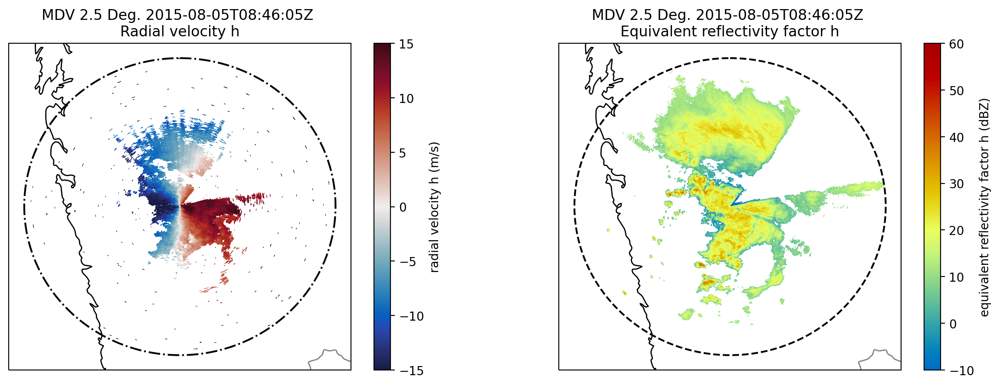

In [167]:
# Let us view the vleocity with the filter applied.
fig = plt.figure(figsize=[15,5],dpi=200)
ax = plt.subplot(1,2,1,projection=ccrs.PlateCarree())
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('VELH', sweep=2, resolution='10m',
                     vmin=-15, vmax=15,
                     projection=ccrs.PlateCarree(), cmap='pyart_balance',
                     gatefilter=gatefilter)
display.plot_range_ring(radar.range['data'][2], line_style='k-.')

ax = plt.subplot(1,2,2,projection=ccrs.PlateCarree())
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('DBZH', sweep=2, resolution='10m',
                     vmin=-10, vmax=60,
                     projection=ccrs.PlateCarree())
display.plot_range_ring(radar.range['data'][2], line_style='k--')
plt.show()

In [11]:
# At this point, we can simply used dealias_region_based to dealias the velocities
# and then add the new field to the radar.
nyq = radar.instrument_parameters['nyquist_velocity']['data'][0]
velocity_dealiased = pyart.correct.dealias_region_based(radar, vel_field='VELH', nyquist_vel=nyq,
                                                        centered=True, gatefilter=gatefilter)
radar.add_field('corrected_velocity', velocity_dealiased, replace_existing=True)

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


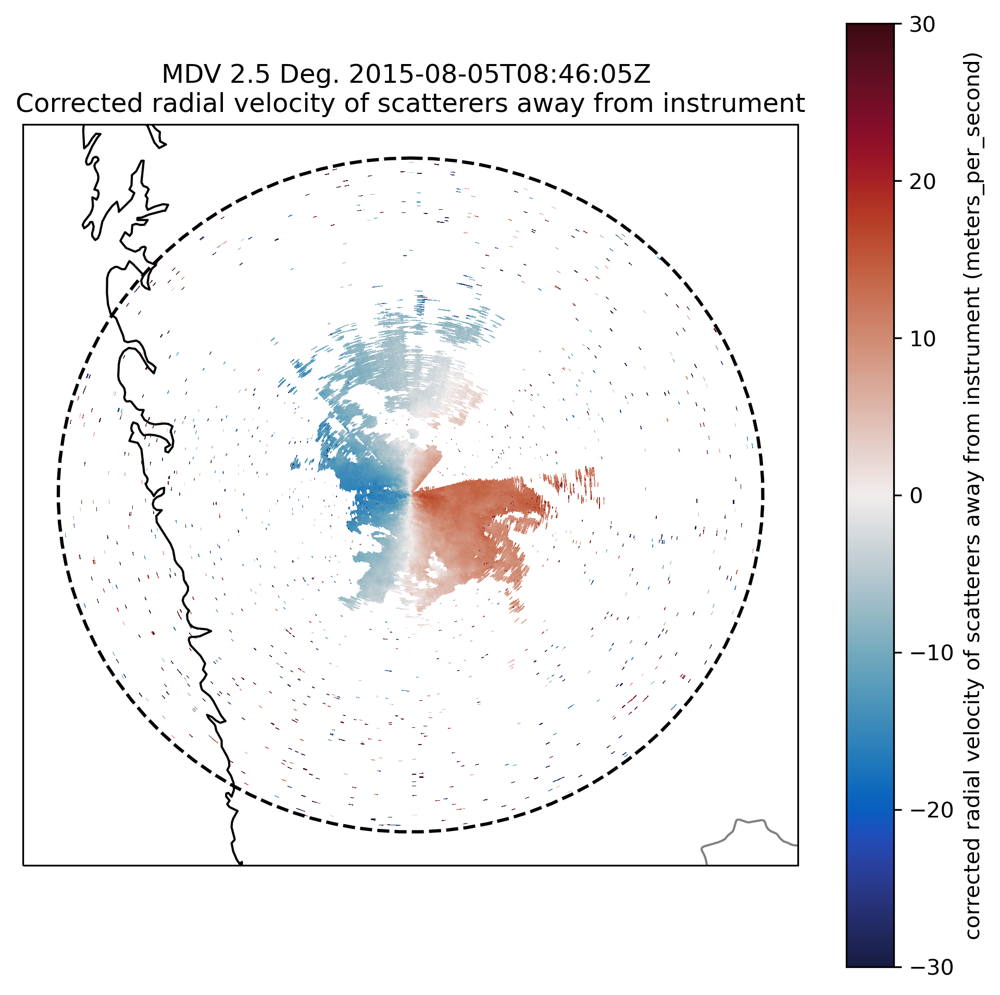

In [77]:
# Plot the new velocities, which now look much more realistic.
fig = plt.figure(figsize=[8, 8],dpi = 300)
display = pyart.graph.RadarMapDisplay(radar)
display.plot_ppi_map('corrected_velocity', sweep=2, resolution='10m',
                     vmin=-30, vmax=30,
                     projection=ccrs.PlateCarree(), cmap='pyart_balance',
                     gatefilter=gatefilter)
display.plot_range_ring(radar.range['data'][2],npts=100, ax=None, col='k', ls='--', lw=1.5)
plt.show()

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. P

/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


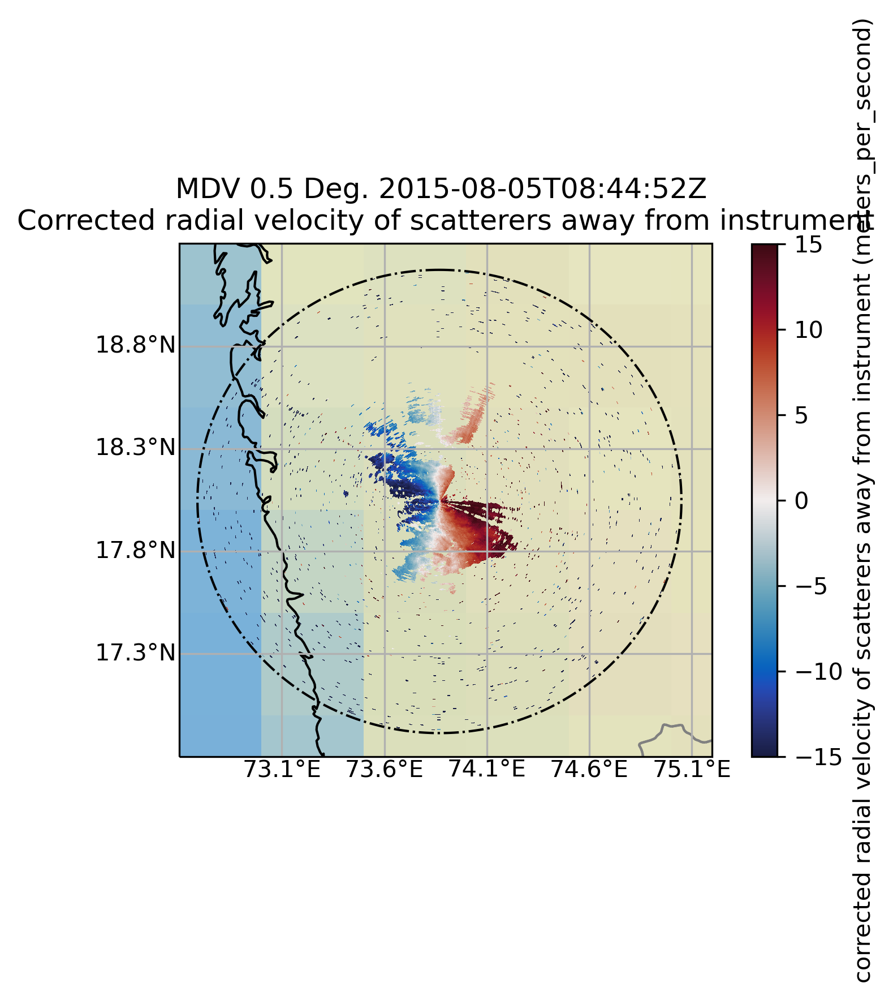

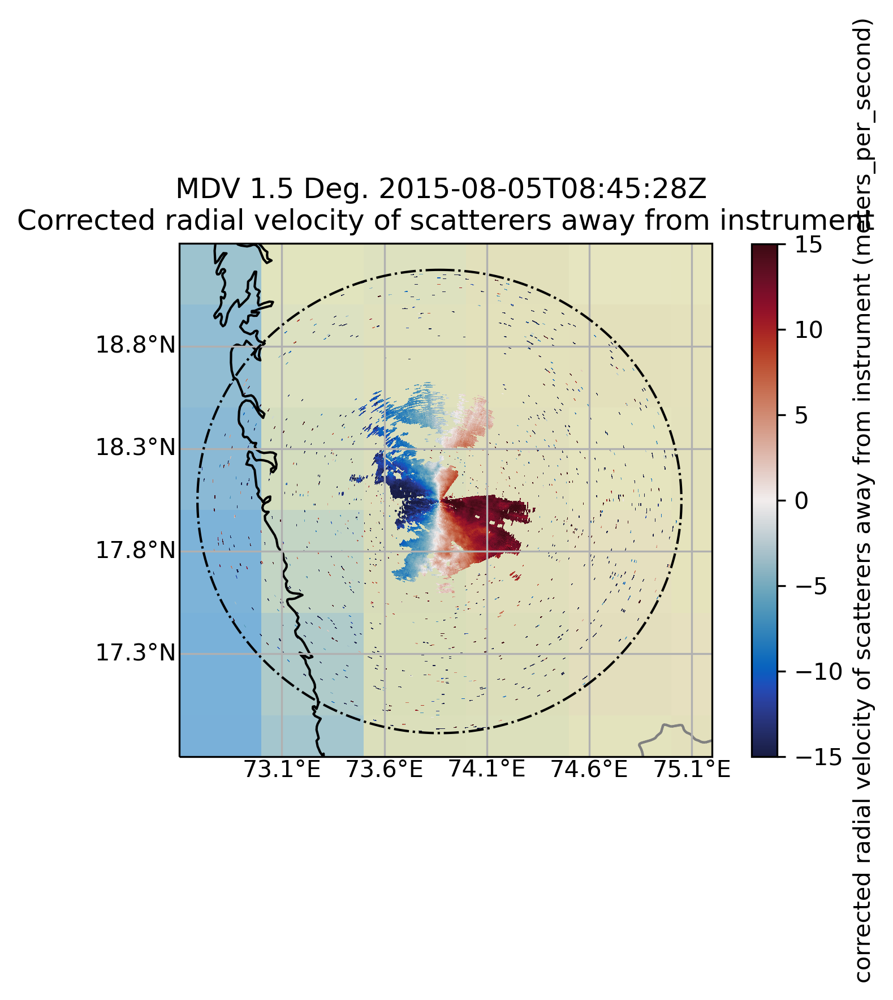

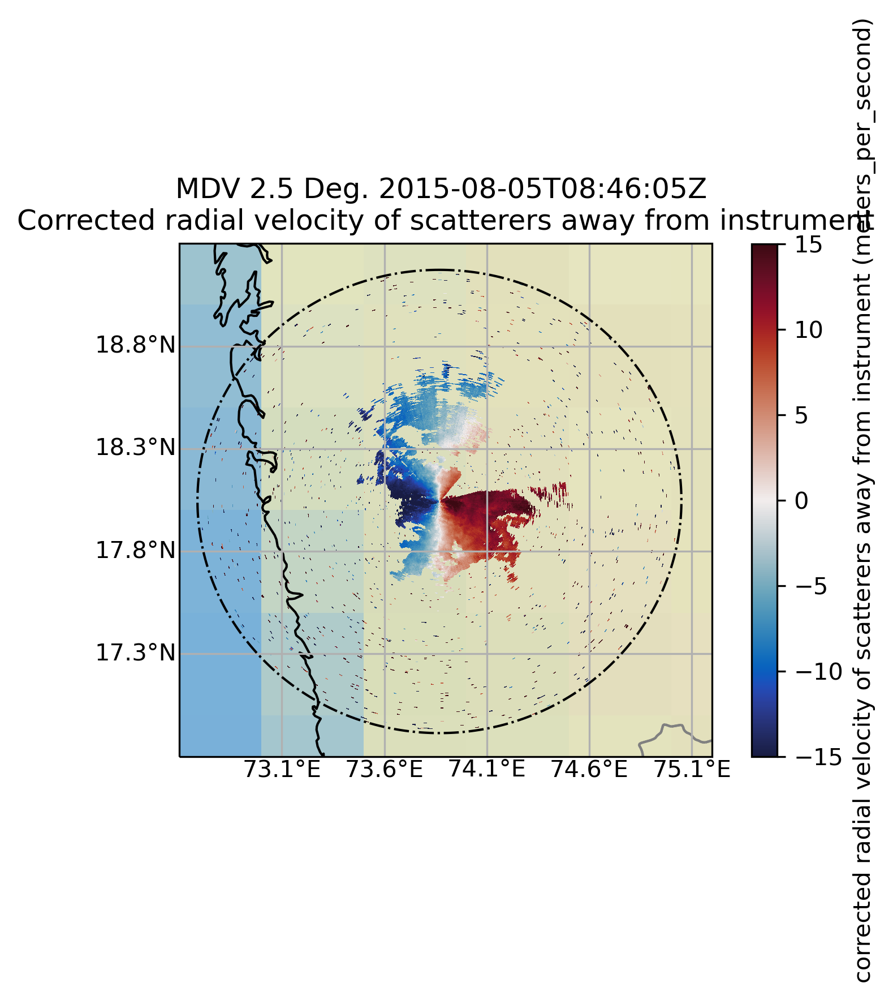

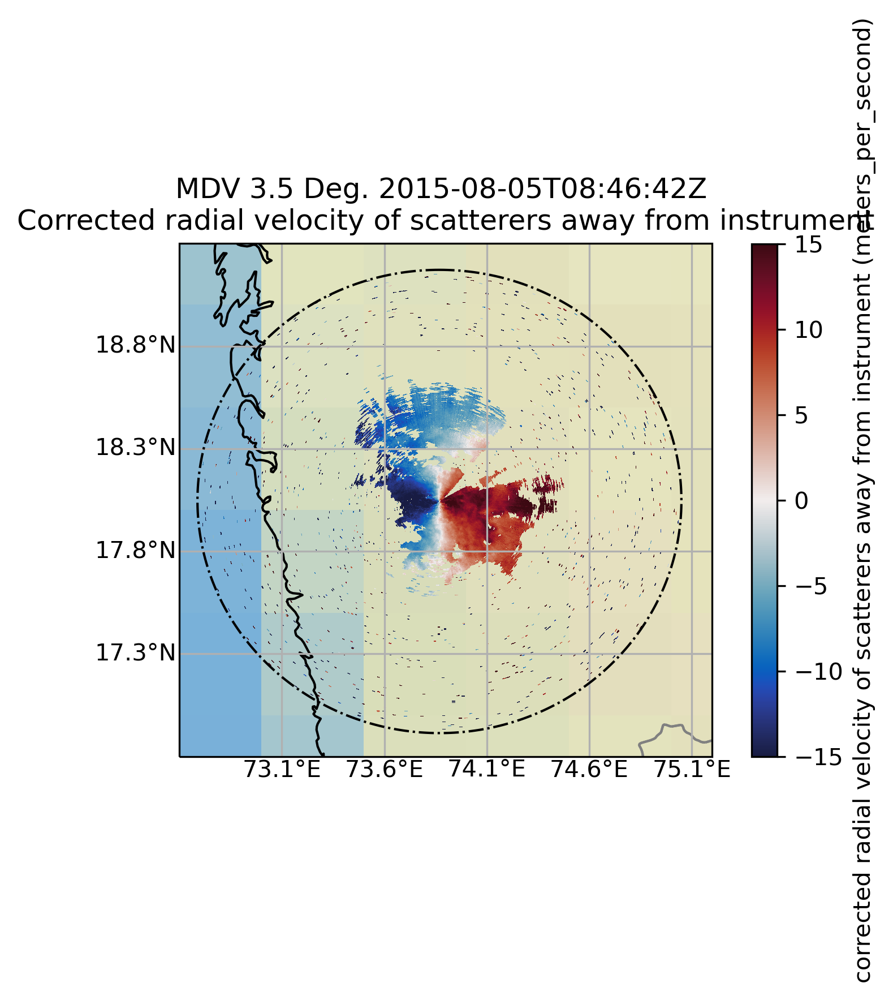

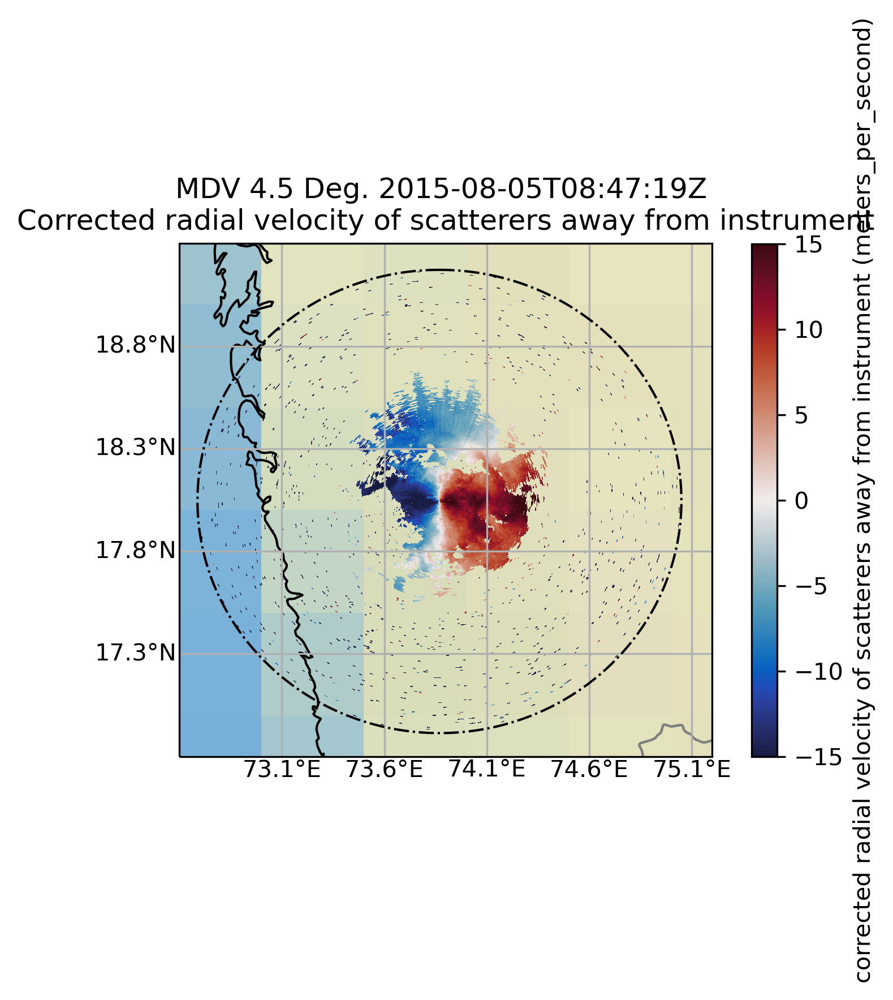

...

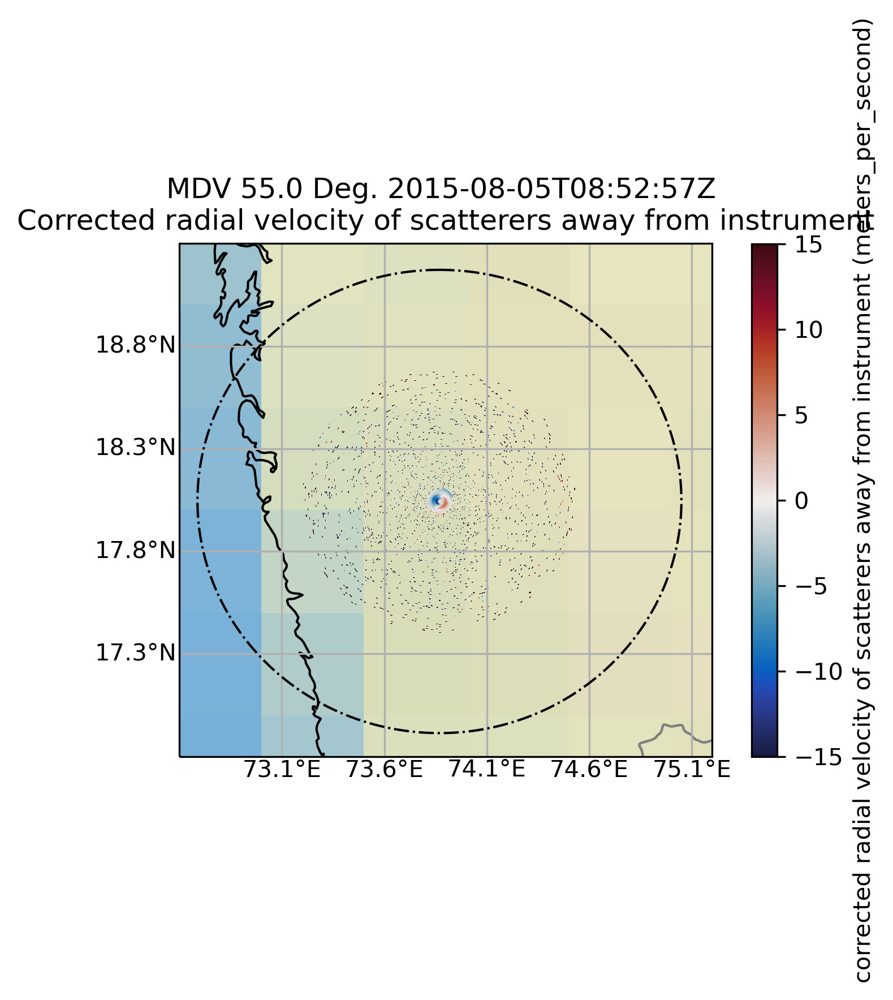

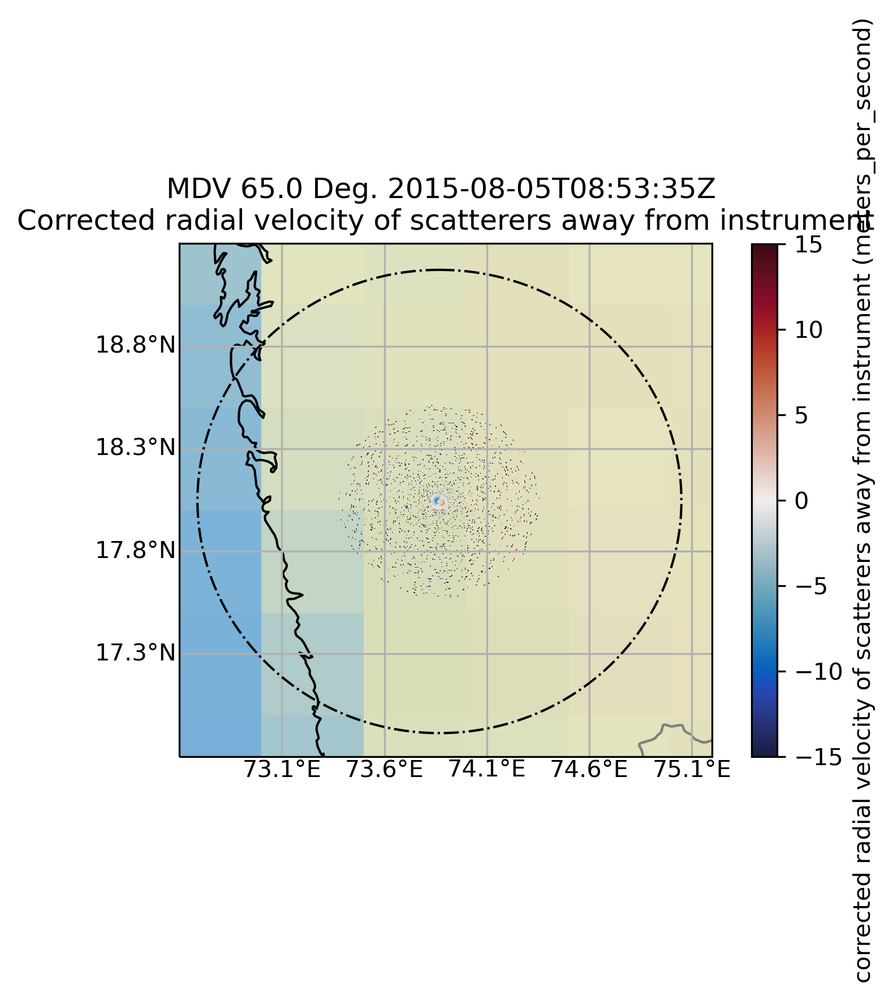

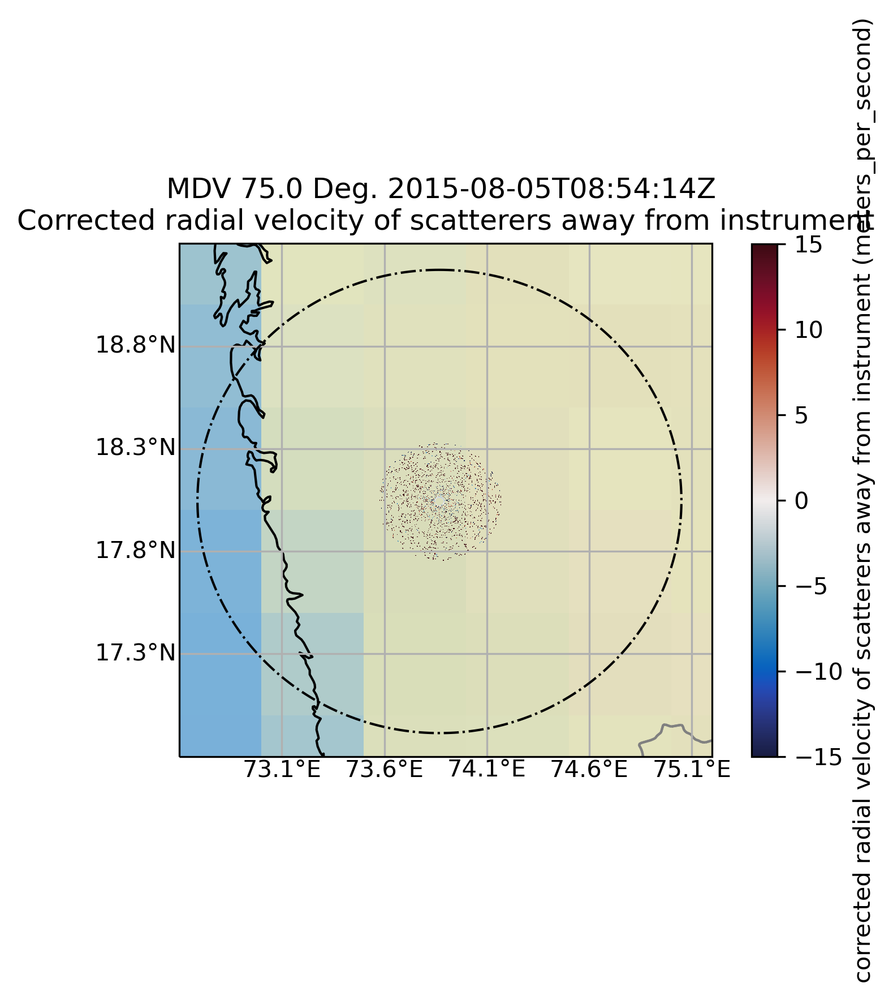

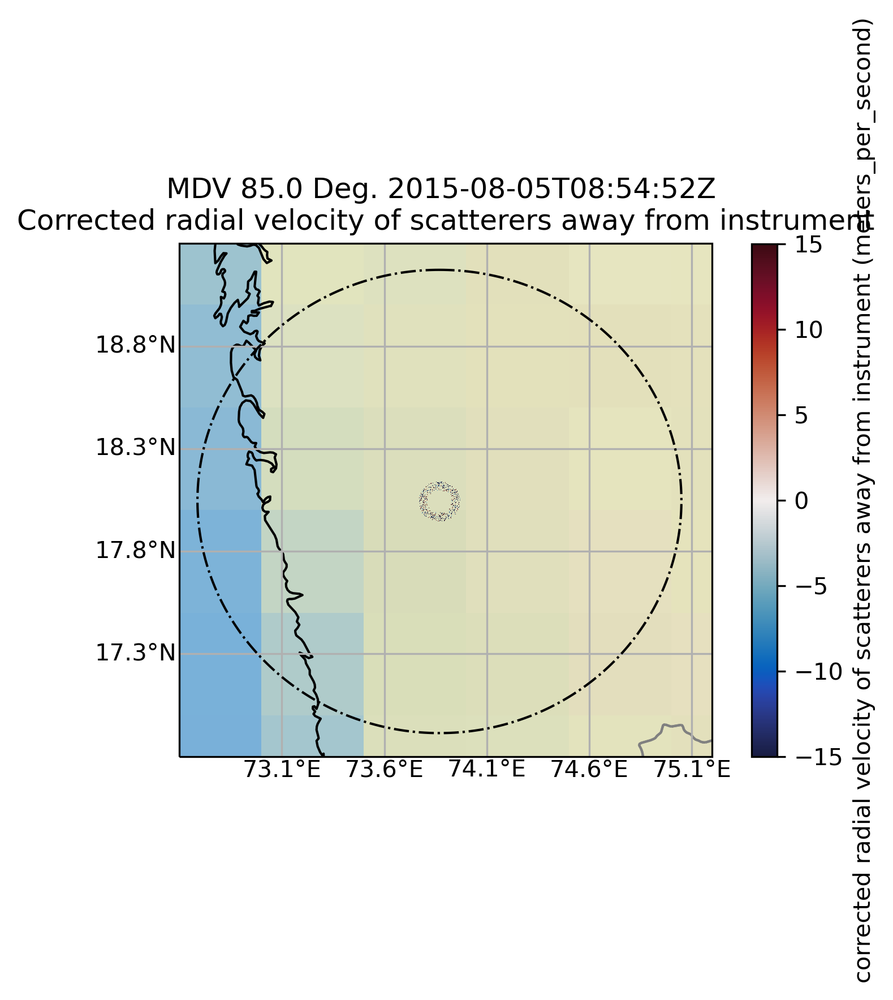

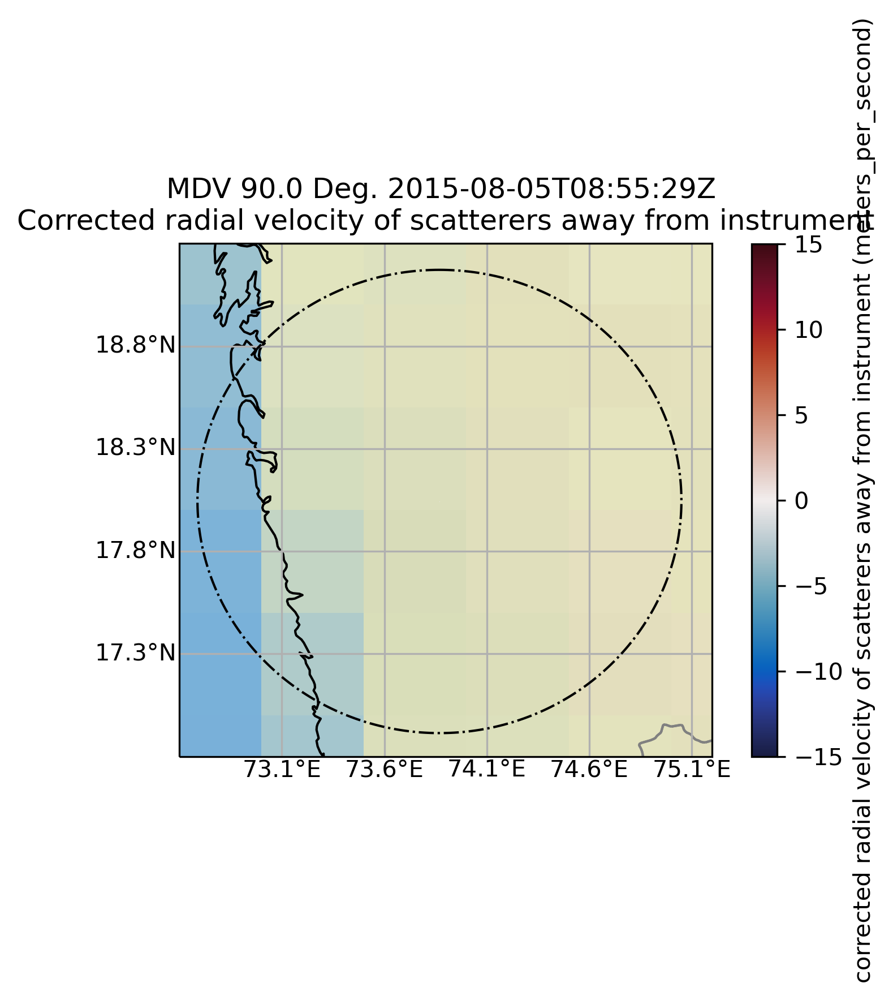

In [142]:
import cartopy.feature as cfeature
land_50m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                        edgecolor='face',
                                        facecolor=cfeature.COLORS['land'])
for i in range(18):
    plt.figure(dpi=300)
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([72.6, 75.2, 16.8,19.3])
    ax.stock_img()
    # Create a feature for States/Admin 1 regions at 1:50m from Natural Earth
    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')
    SOURCE = 'Natural Earth'
    LICENSE = 'public domain'

    ax.add_feature(cfeature.LAND)
    #ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(states_provinces, edgecolor='gray')

    # Add a text annotation for the license information to the
    # the bottom right corner.
    display.plot_ppi_map('corrected_velocity', sweep=i, resolution='10m',
                         vmin=-15, vmax=15,lon_lines=np.arange(72.6,75.2, .5),
                         lat_lines=np.arange(16.8,19.3, .5),
                         fig=fig, lat_0=radar.latitude['data'][0],
                         lon_0=radar.longitude['data'][0],
                         projection=ccrs.PlateCarree(), cmap='pyart_balance',
                         gatefilter=gatefilter)
    display.plot_range_ring(radar.range['data'][2], line_style='k-.' ,lw='1')
    #ax.gridlines(crs=None, draw_labels=False, xlocs=None, ylocs=None)
    plt.savefig(r'/Users/rizvi/Documents/Project/Jup/plots'+'//' + 'cv' + str(i+1) +'.jpg')
    #plt.show()
